# Data Understanding
 The typical Machine Learning workflows follows a basic set of steps that are fundamental to all use cases. Here, we take a look at more or less the preprocessing steps that involves loading data, differentiating between numerical and categorical data, and visualizing the data to gather some high level data. This initial approach or preprocessing usually can tell whether machine learning is suitable for an application use case or not. In some cases, some statistical analysis might be sufficient already. Other times, it shows us redundant data, null values and other features we might need to re-engineer to fit well into our model.

https://johdev.com/machine%20learning/2020/03/24/End-to-End-Data-Science-Project-with-Adult-Income-Dataset.html


## Data
The data used for this analysis can be found at https://www.openml.org/d/1590. The initial aim of the data was to predict whether a person would earn over 50k a year based on heterogeneous data such as age, employment, education, family information and others. 

In [1]:
# We will use Pandas, a Python Library for working with 1D and 2D structured data, to call in the datasets.  
import pandas as pd 
adult_census = pd.read_csv('adult_census.csv')

## Exploring the Data Features and records

Pandas stores the data as Dataframe, a 2D structured data that can be shown as tables. One first level inspection of the data can be done with the use of head(), tail(), and sample() which shows the first few, last few and random samples in the data respectively. 

In [2]:
adult_census.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


In [3]:
adult_census.tail()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
48841,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


In [4]:
adult_census.sample(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class
32278,68,Self-emp-inc,136218,HS-grad,9,Widowed,Other-service,Unmarried,White,Female,0,0,15,United-States,<=50K
43758,26,Private,190762,Some-college,10,Married-civ-spouse,Sales,Husband,White,Male,0,0,18,United-States,<=50K
1784,71,Private,258126,9th,5,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,39,Cuba,<=50K
20432,46,State-gov,106705,Some-college,10,Divorced,Prof-specialty,Unmarried,White,Female,1506,0,50,United-States,<=50K
14829,20,Private,73266,Some-college,10,Never-married,Transport-moving,Own-child,Asian-Pac-Islander,Male,0,0,40,United-States,<=50K
15270,25,Private,202203,Bachelors,13,Never-married,Adm-clerical,Unmarried,White,Female,0,0,60,United-States,<=50K
15616,38,Federal-gov,99280,Some-college,10,Divorced,Adm-clerical,Not-in-family,White,Female,0,0,30,United-States,<=50K
24166,25,Private,108658,HS-grad,9,Never-married,Exec-managerial,Not-in-family,White,Male,0,0,45,United-States,<=50K
14460,39,Private,230467,Bachelors,13,Never-married,Sales,Own-child,White,Male,0,0,40,Germany,<=50K
11775,46,Self-emp-inc,222829,Masters,14,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,60,United-States,>50K


The column class is our target variable. This makes the classification problem a binary classification problem, using the other variables as input. 

In [6]:
target_column = 'class'
adult_census[target_column].value_counts()

 <=50K    37155
 >50K     11687
Name: class, dtype: int64

The value count in our target class shows us a typical challenge in practical machine learning known as Class Imbalance. This is important to pay special attention to when building predictive models. For example, in the medical field when trying to predict whether subject will develop a rare disease or not, the subjects without the rare disease usually dominate the data.

Numerical versus Categorical Variables. 
The dataset contains both numerical and categorical variables. Numerical variables are variables that contain continous values whereas categorical variables contain a finite number of values e.g. native-countries. 

In [7]:
numerical_columns = [
    'age', 'education-num', 'capital-gain', 'capital-loss',
    'hours-per-week']
categorical_columns = [
    'workclass', 'education', 'marital-status', 'occupation',
    'relationship', 'race', 'sex', 'native-country']
all_columns = numerical_columns + categorical_columns + [
    target_column]

adult_census = adult_census[all_columns]

In [9]:
print(f"The dataset contains {adult_census.shape[0]} samples/ records and "
      f"{adult_census.shape[1]} columns")

The dataset contains 48842 samples/ records and 14 features/ columns


In [10]:
print(f"The dataset contains {adult_census.shape[1] - 1} features.")

The dataset contains 13 features.


 ## Visual Inspection of the data
This helps to identify if there are alternative ways of solving the tasks at hand without ML, identify if the datasets actually contain the necessary information and shows the peculiarities that might have occurred during data collection like the malfunctioning of sensors or missing values. 

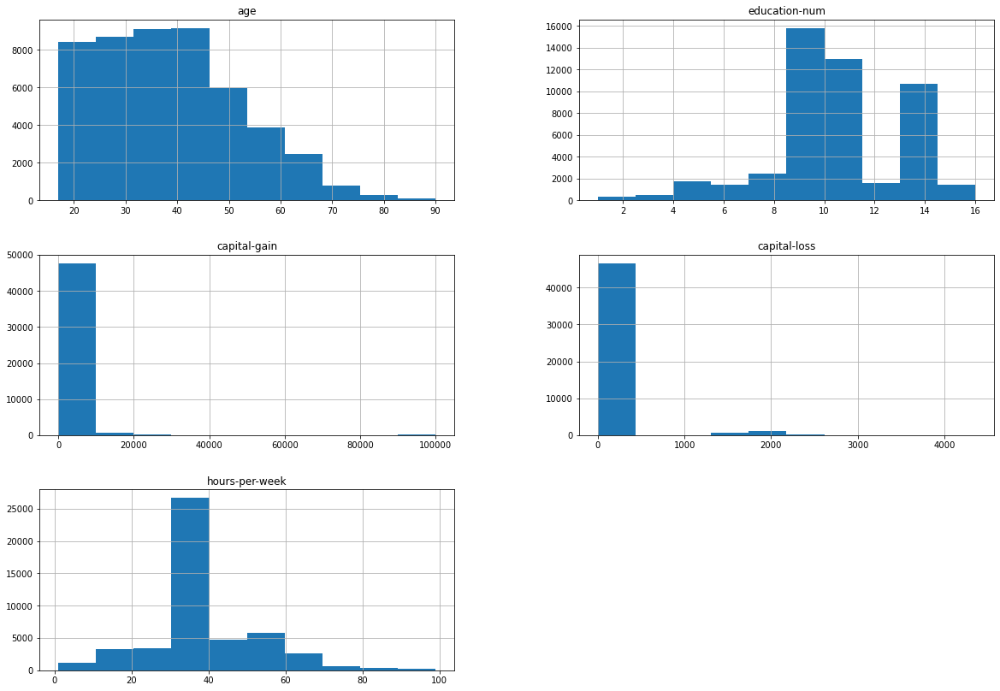

In [14]:
_ = adult_census.hist(figsize=(20, 14))

From the plots above, we can already see certain information about:
The age: There not much information about age > 70. 
The Education-num: This peaks at 8 to 10 hours and another peak/ near peak at 14. 
The capital gains and loss didn't show much information since they are mostly close to zero, while the hours spent per week also peaks at 40 hours.

Next, we can look into distribution of the categorical variables

In [16]:
categorical_columns

['workclass',
 'education',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'native-country']

In [26]:
for val in categorical_columns: 
    print(f"Category is: {val} ")
    print(adult_census[val].value_counts())
    print()
    print("=================================")

Category is: workclass 
 Private             33906
 Self-emp-not-inc     3862
 Local-gov            3136
 ?                    2799
 State-gov            1981
 Self-emp-inc         1695
 Federal-gov          1432
 Without-pay            21
 Never-worked           10
Name: workclass, dtype: int64

Category is: education 
 HS-grad         15784
 Some-college    10878
 Bachelors        8025
 Masters          2657
 Assoc-voc        2061
 11th             1812
 Assoc-acdm       1601
 10th             1389
 7th-8th           955
 Prof-school       834
 9th               756
 12th              657
 Doctorate         594
 5th-6th           509
 1st-4th           247
 Preschool          83
Name: education, dtype: int64

Category is: marital-status 
 Married-civ-spouse       22379
 Never-married            16117
 Divorced                  6633
 Separated                 1530
 Widowed                   1518
 Married-spouse-absent      628
 Married-AF-spouse           37
Name: marital-status, dtyp

In [28]:
#Next, we can take a look at the relationship between education-num and education column, since noted the peak in education-num column earlier.
pd.crosstab(index=adult_census['education'], columns = adult_census['education-num'])


education-num,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
education,,,,,,,,,,,,,,,,
10th,0,0,0,0,0,1389,0,0,0,0,0,0,0,0,0,0
11th,0,0,0,0,0,0,1812,0,0,0,0,0,0,0,0,0
12th,0,0,0,0,0,0,0,657,0,0,0,0,0,0,0,0
1st-4th,0,247,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5th-6th,0,0,509,0,0,0,0,0,0,0,0,0,0,0,0,0
7th-8th,0,0,0,955,0,0,0,0,0,0,0,0,0,0,0,0
9th,0,0,0,0,756,0,0,0,0,0,0,0,0,0,0,0
Assoc-acdm,0,0,0,0,0,0,0,0,0,0,0,1601,0,0,0,0
Assoc-voc,0,0,0,0,0,0,0,0,0,0,2061,0,0,0,0,0


This shows us that education and education-num gives us the same information. For instance, education-num 9 corresponds to some-college. We can therefore reduce the redundancy in the data without losing information. We can always keep in mind that redundancy or highly correlated data can be problemetic to the development of predictive machine learning models. 

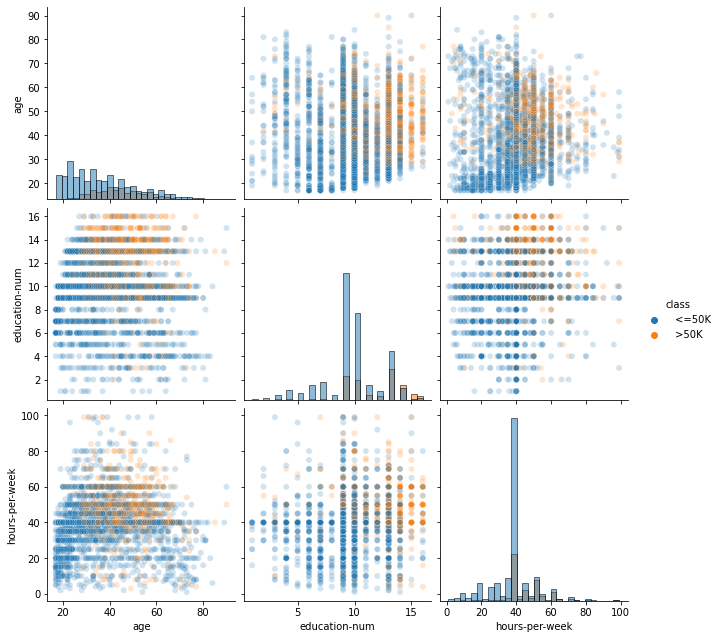

In [33]:
#Pairplot to show how each variable differs according to our target class. Plots along the diagonal shows the distribution of individual variables for each class. 

import seaborn as sns
#To keep the plot readable and plot faster, we will plot only a subset of the data. 
n_samples = 5000
columns = ['age', 'education-num', 'hours-per-week']
_ = sns.pairplot(data=adult_census[: n_samples], vars=columns, hue=target_column, plot_kws={'alpha': 0.2}, height=3, diag_kind='hist', diag_kws={'bins': 30})

## Handcrafted Decision Rules
From the visuals above, we can already formulate some ideas on how predict whether or not a person would earn above 50k. If for example, we focus on the combination of hours per week and age features. 

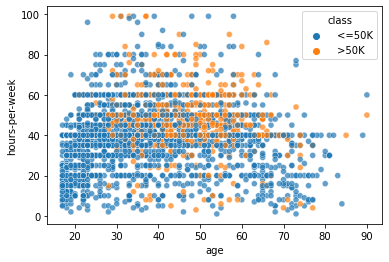

In [36]:
_ = sns.scatterplot(
    x="age", y="hours-per-week", data=adult_census[:n_samples],
    hue="class", alpha=0.7,
)

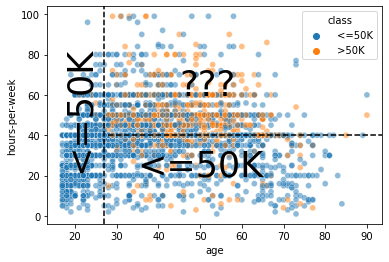

In [38]:
import matplotlib.pyplot as plt

ax = sns.scatterplot(
    x="age", y="hours-per-week", data=adult_census[:n_samples],
    hue="class", alpha=0.5,
)

age_limit = 27
plt.axvline(x=age_limit, ymin=0, ymax=1, color="black", linestyle="--")

hours_per_week_limit = 40
plt.axhline(
    y=hours_per_week_limit, xmin=0.18, xmax=1, color="black", linestyle="--"
)

plt.annotate("<=50K", (17, 25), rotation=90, fontsize=35)
plt.annotate("<=50K", (35, 20), fontsize=35)
_ = plt.annotate("???", (45, 60), fontsize=35)

One important thing to note is that in a Machine Learning setting, a model automatically creates the rules from the data to make predictions on unseen data. 